In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from keras.datasets import mnist
import pandas as pd
from sklearn.multiclass import OneVsRestClassifier
import glob
from PIL import Image
import gzip
import os
import requests 
from sklearn.svm import SVC, LinearSVC
from google.colab import drive
drive.mount('/content/drive')
from sklearn.metrics import confusion_matrix
import sklearn.metrics as metrics
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.preprocessing import label_binarize
from sklearn.metrics import auc
import matplotlib.pyplot as plt
from scipy import interp
from itertools import cycle
from sklearn.svm import LinearSVC
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
import cv2 as cv
from sklearn.model_selection import cross_validate

Mounted at /content/drive


In [ ]:
!pip install unrar

# **Section 1**

## **Functions**

In [ ]:
def generate_binary_dataset(min_value, max_value, size, positive_condition):
    data = pd.DataFrame(np.concatenate((np.random.uniform(min_value, max_value, (size, 2)),-np.ones((size, 1))), axis=1),  columns=['x', 'y', 'target'])
    data.loc[positive_condition(data.x, data.y), 'target'] = 1
    return data

In [ ]:
def plot_separator(svc):
    ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    xx = np.linspace(xlim[0], xlim[1], 30)
    yy = np.linspace(ylim[0], ylim[1], 30)
    YY, XX = np.meshgrid(yy, xx)
    xy = np.vstack([XX.ravel(), YY.ravel()]).T
    Z = svc.decision_function(xy).reshape(XX.shape)
    ax.contour(XX, YY, Z, colors='k', levels=[-1, 0, 1], alpha=0.5, linestyles=['--', '-', '--'])
    ax.scatter(svc.support_vectors_[:, 0], svc.support_vectors_[:, 1], s=100, linewidth=1, label="support vectors", facecolors='none', edgecolors='k')

In [ ]:
def plot_binary(data, svc=None):
    plt.figure(figsize=(15, 15))
    plt.scatter(data.x, data.y, c=data.target, label="data", s=20, cmap=plt.cm.seismic)
    
    if svc:
        plot_separator(svc)
    
    plt.grid()
    plt.legend()

## **Example 1**

### **data**

In [ ]:
dataset = generate_binary_dataset(-10, 10, 1000, lambda x, y: x  > y)
dataset.head()

,x,y,target
0,-6.325697,-0.095887,-1.0
1,-5.451583,-0.950370,-1.0
2,6.269285,-9.412425,1.0
3,-7.792884,-5.845229,-1.0
4,6.466569,-0.609774,1.0


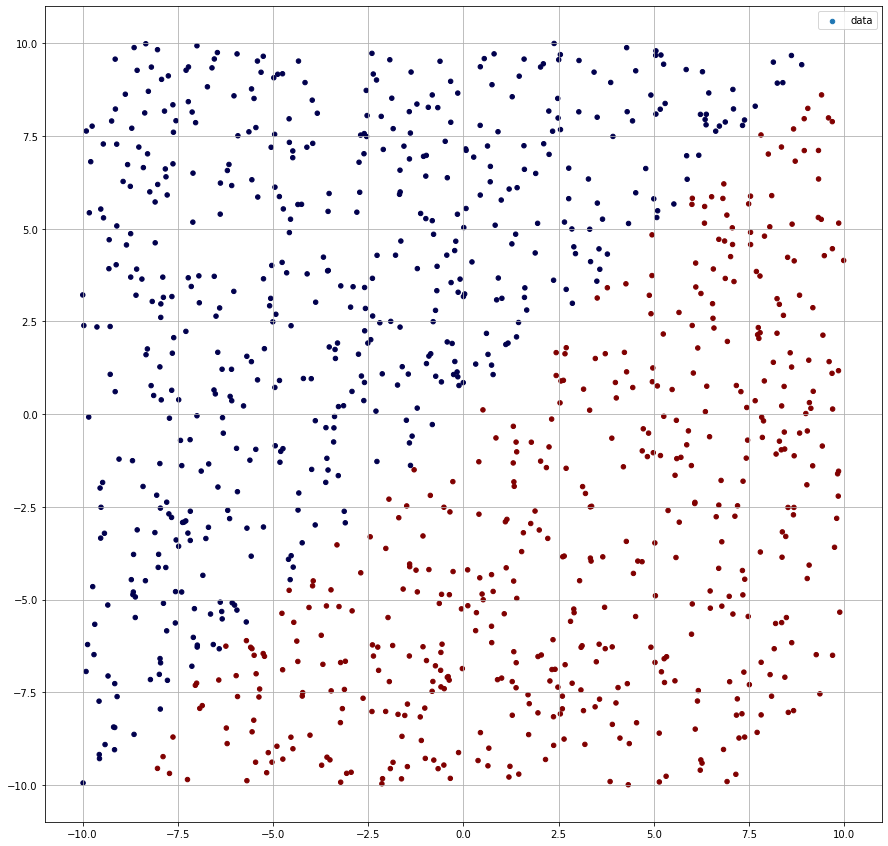

In [ ]:
plot_binary(dataset)

### **Linear**

In [ ]:
model = SVC(kernel="linear")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.997

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


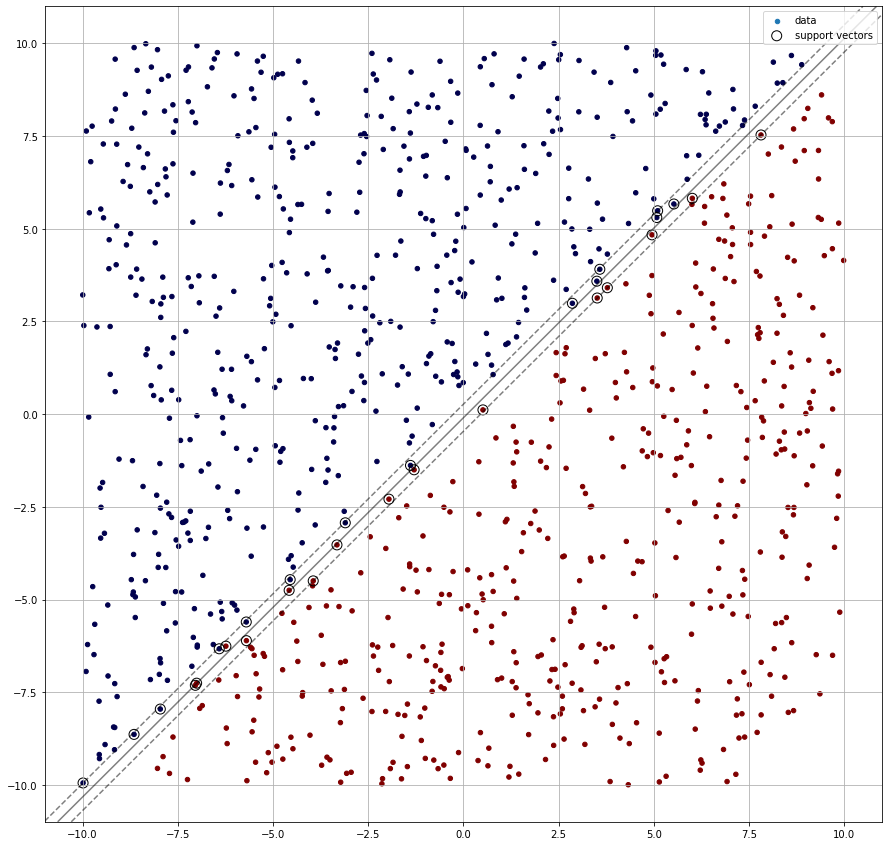

In [ ]:
plot_binary(dataset, model)

### **rbf**

In [ ]:
model = SVC(kernel='rbf')
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.992

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


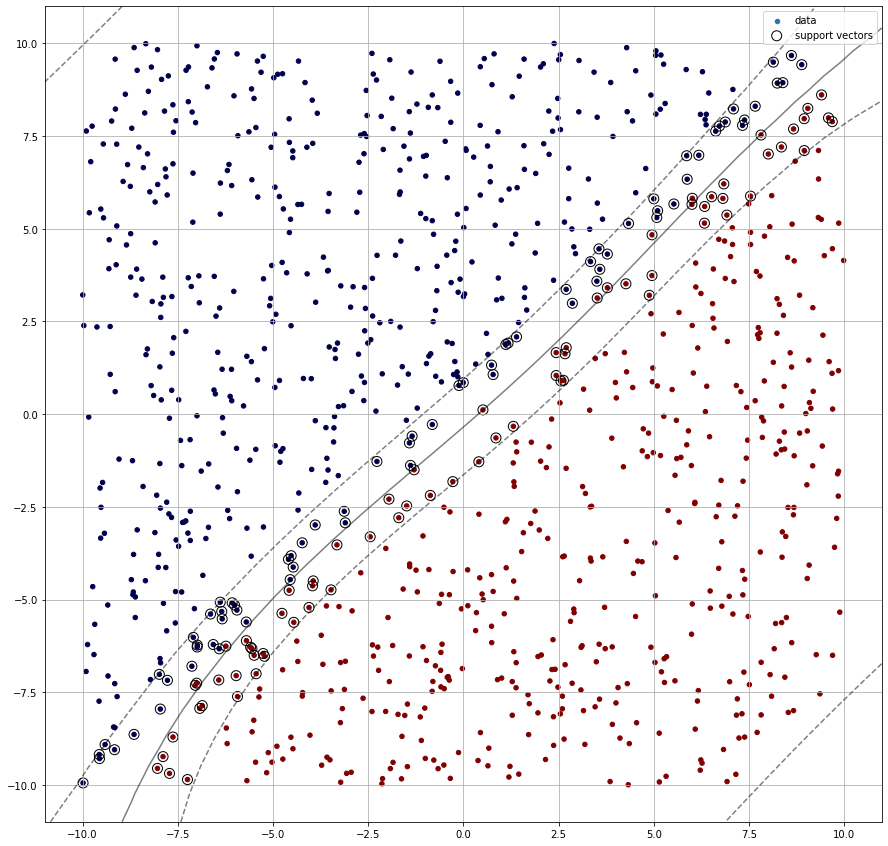

In [ ]:
plot_binary(dataset, model)

### **poly degree = 2** 

In [ ]:
model = SVC(kernel='poly', degree=2, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.52

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


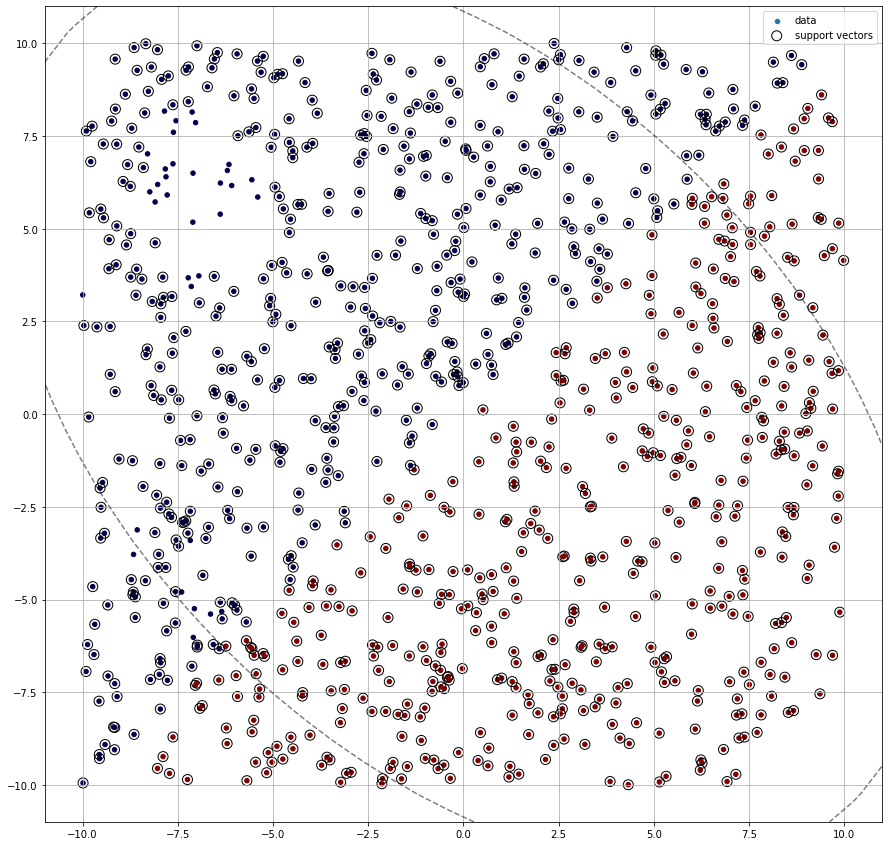

In [ ]:
plot_binary(dataset, model)

### **poly degree = 3**

In [ ]:
model = SVC(kernel='poly', degree=3, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.96

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


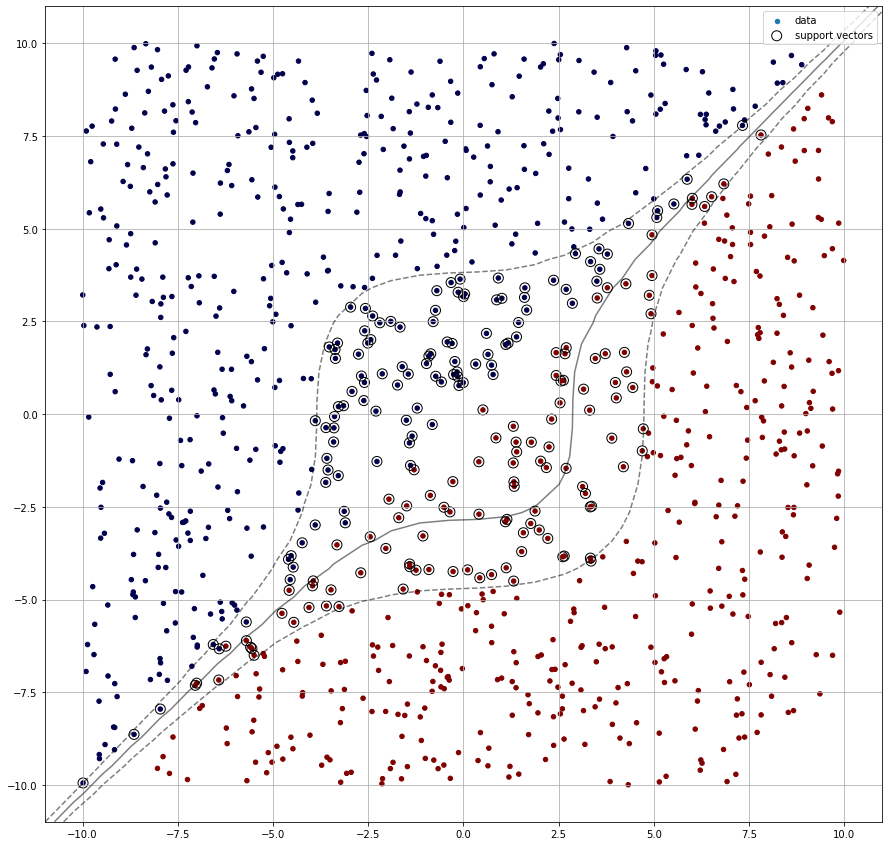

In [ ]:
plot_binary(dataset, model)

### **sigmoid**

In [ ]:
model = SVC(kernel="sigmoid")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.874

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


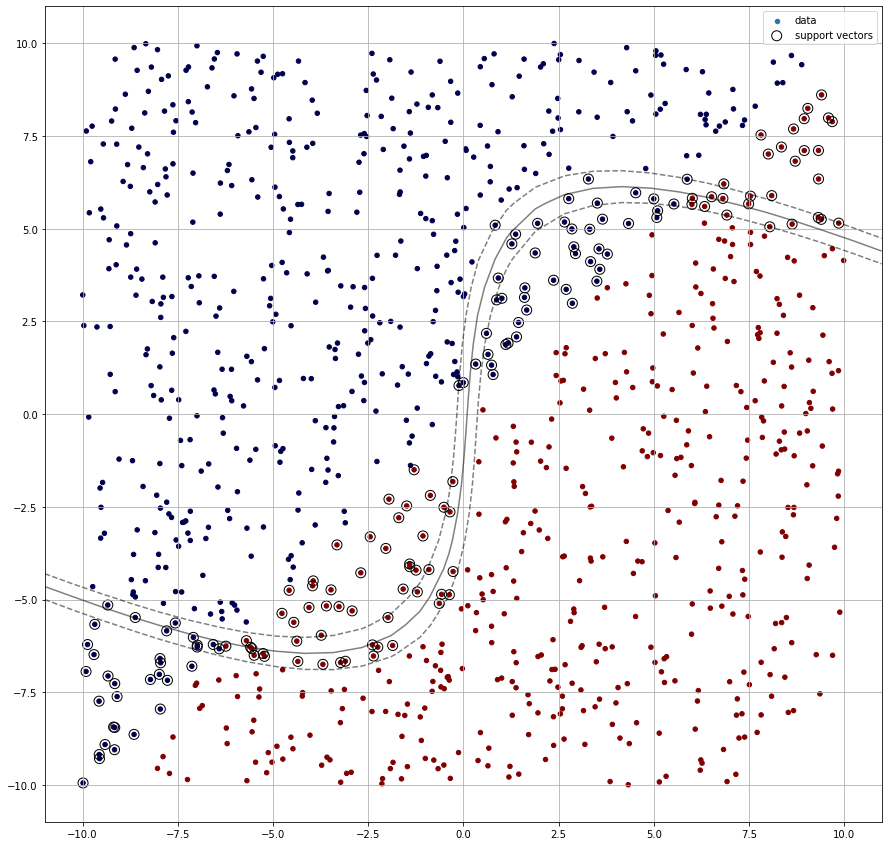

In [ ]:
plot_binary(dataset, model)

## **Example 2**

### **data**

In [ ]:
dataset = generate_binary_dataset(-2, 2, 2000, lambda x, y: x ** 2 + y ** 2 < 1)
dataset.head()

,x,y,target
0,-0.196275,0.476149,1.0
1,0.551684,-0.259606,1.0
2,-1.182871,-1.030645,-1.0
3,1.128409,1.052292,-1.0
4,-0.805193,-1.544665,-1.0


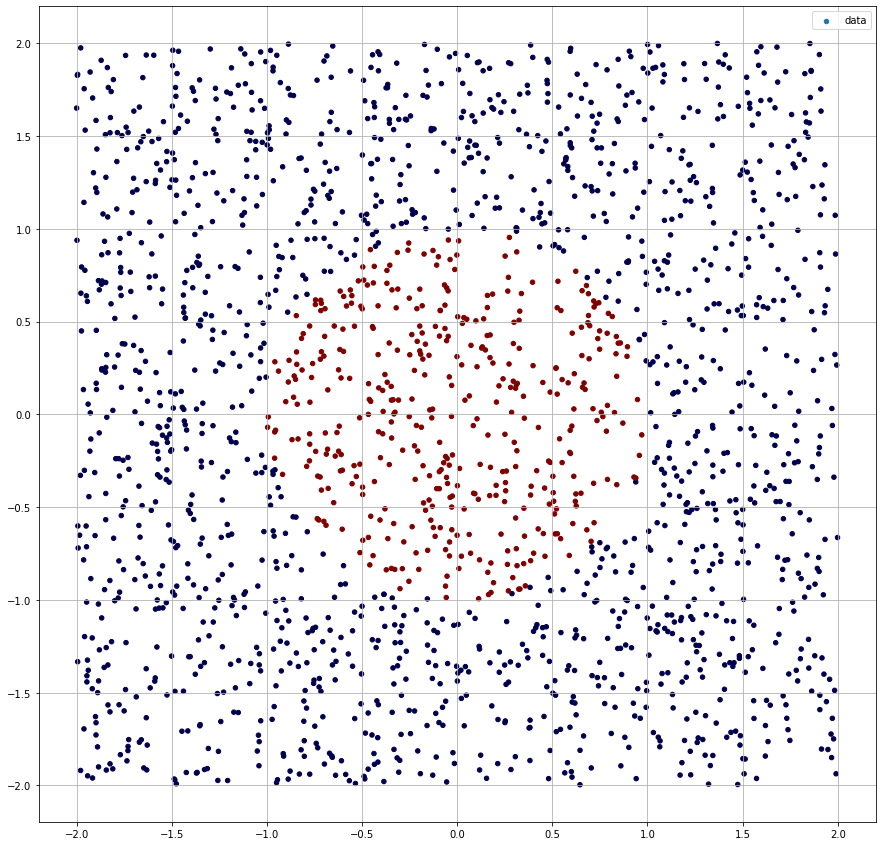

In [ ]:
plot_binary(dataset)

### **linear**

In [ ]:
model = SVC(kernel="linear")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.7875

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


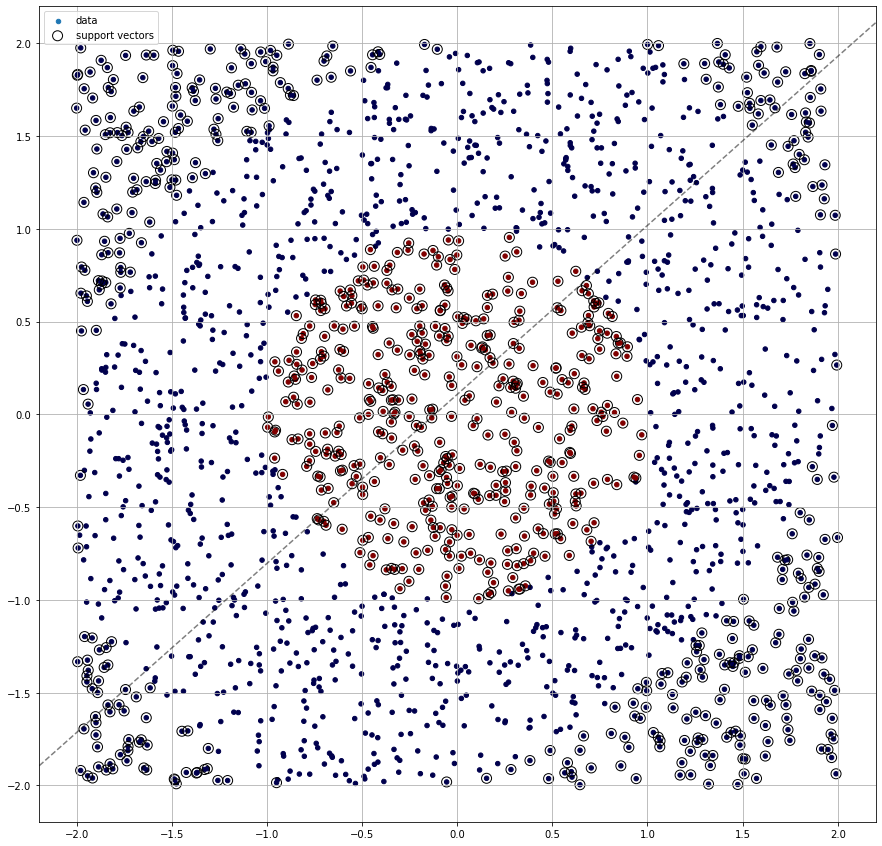

In [ ]:
plot_binary(dataset, model)

### **rbf**

In [ ]:
model = SVC(kernel='rbf')
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.9955

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


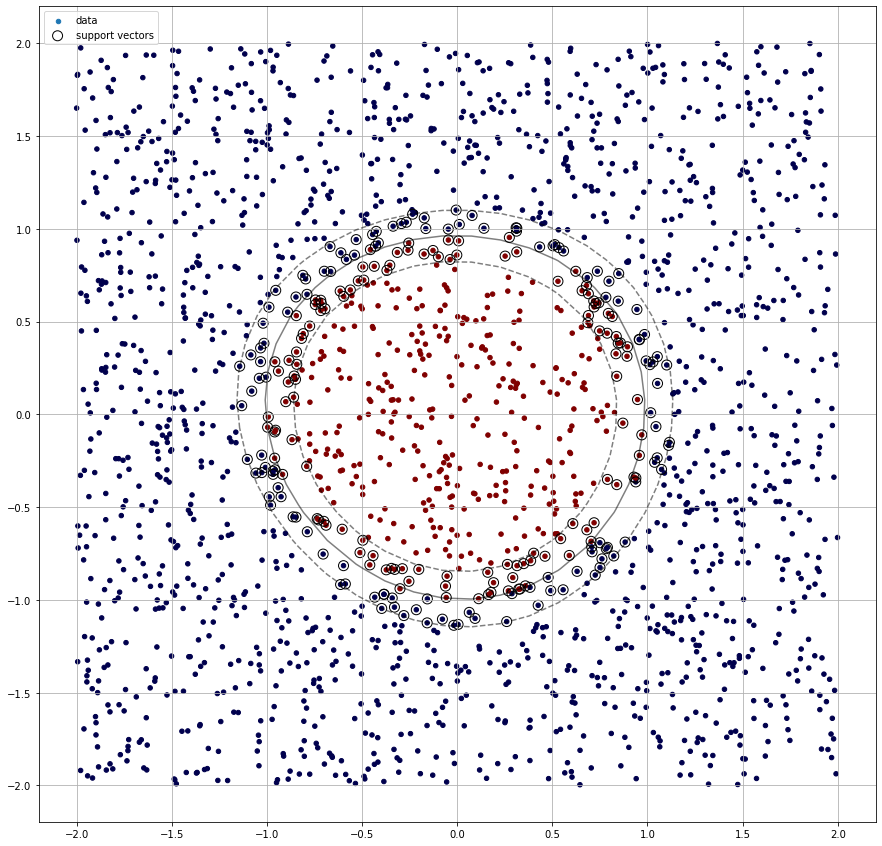

In [ ]:
plot_binary(dataset, model)

### **poly degree = 2**

In [ ]:
model = SVC(kernel='poly', degree=2, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.997

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


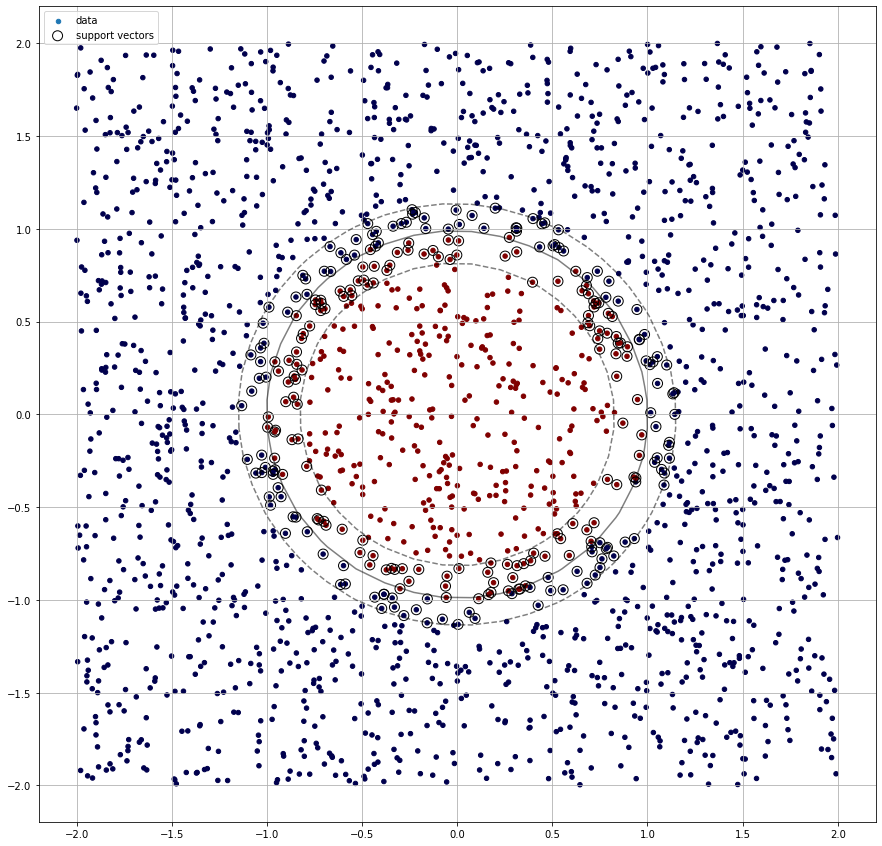

In [ ]:
plot_binary(dataset, model)

### **poly degree = 3**

In [ ]:
model = SVC(kernel='poly', degree=3, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.7875

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


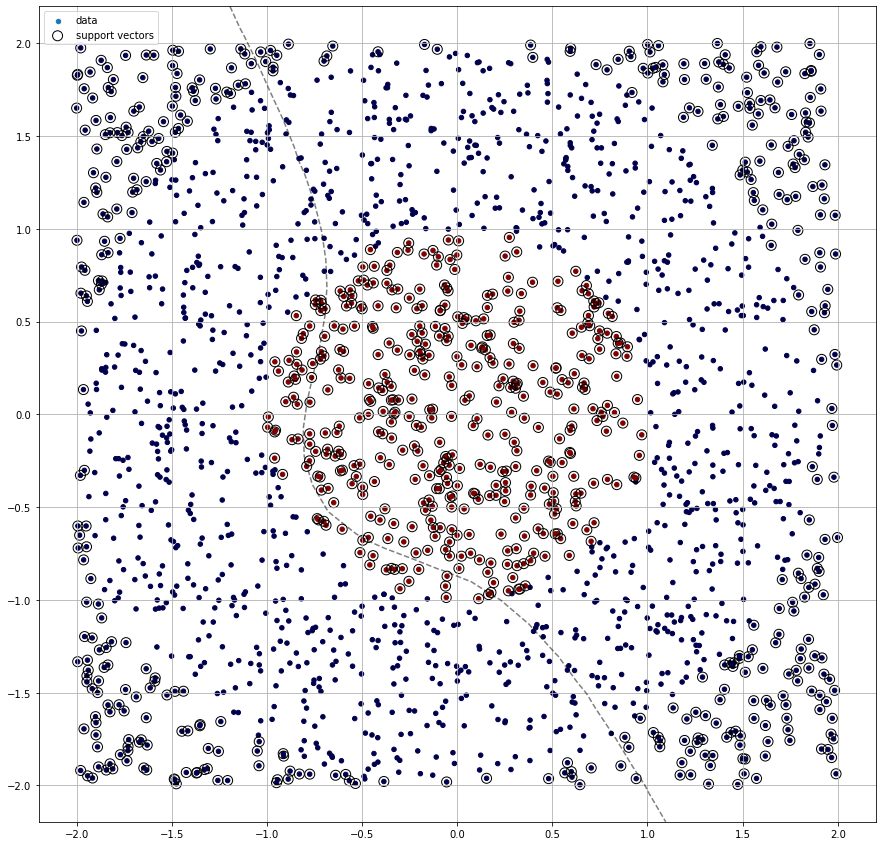

In [ ]:
plot_binary(dataset, model)

### **sigmoid**

In [ ]:
model = SVC(kernel="sigmoid")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.5845

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


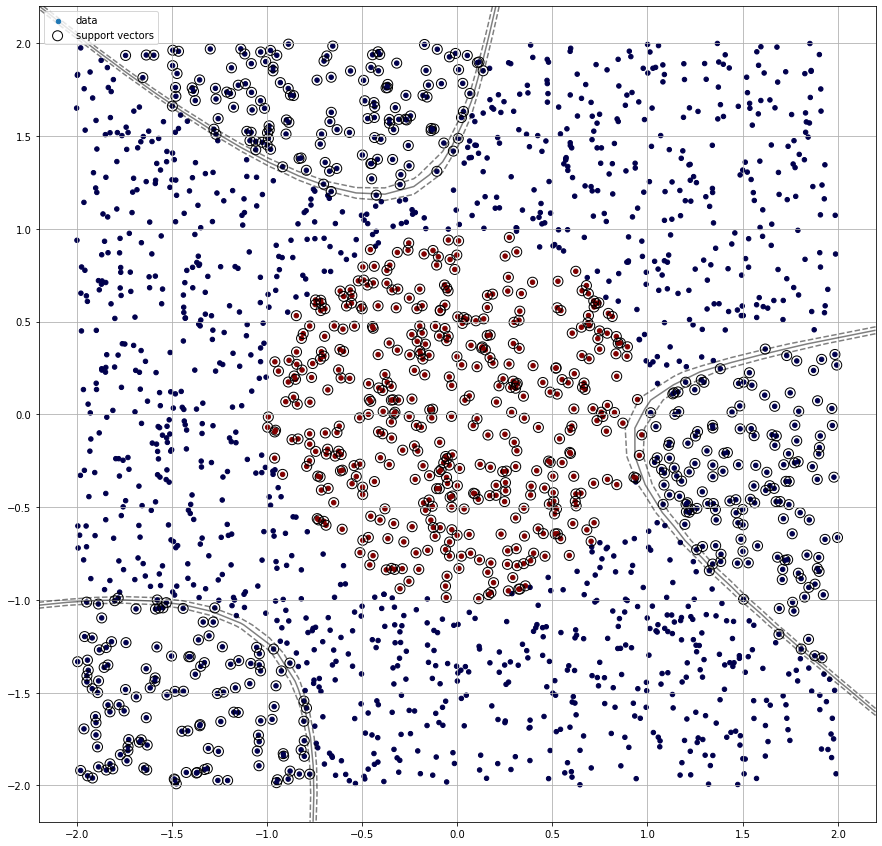

In [ ]:
plot_binary(dataset, model)

## **Example 3**

### **data**

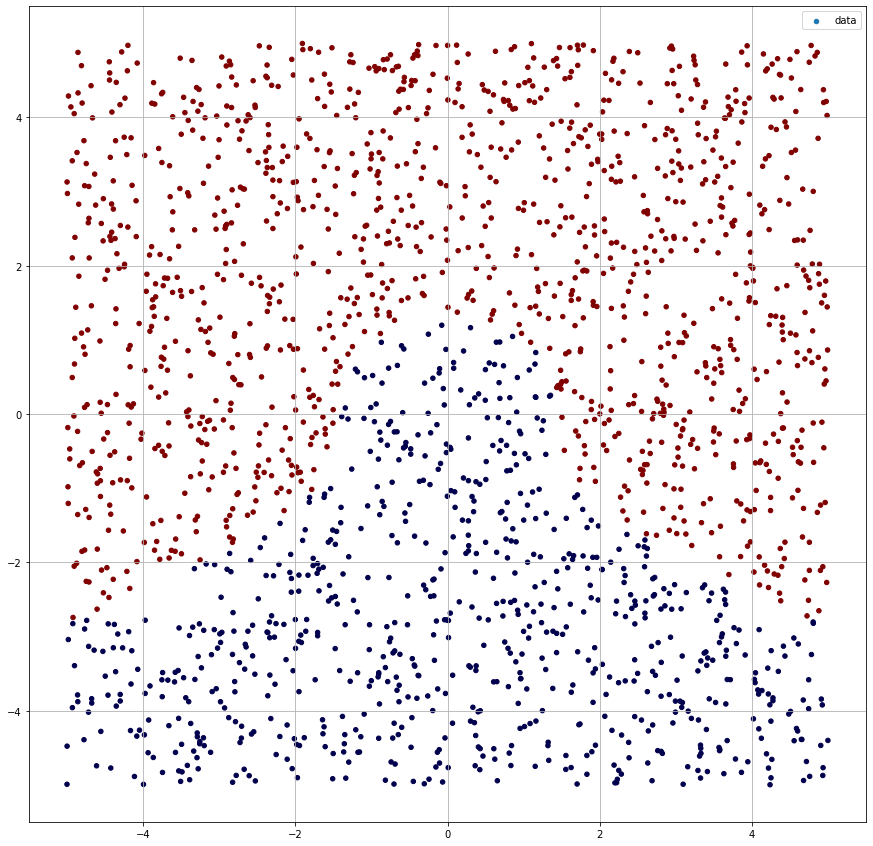

In [ ]:
dataset = generate_binary_dataset(-5, 5, 2000, lambda x, y: x ** 2 +  y**3 > 2)
dataset.head()
plot_binary(dataset)

### **linear**

In [ ]:
model = SVC(kernel="linear")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.8835

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


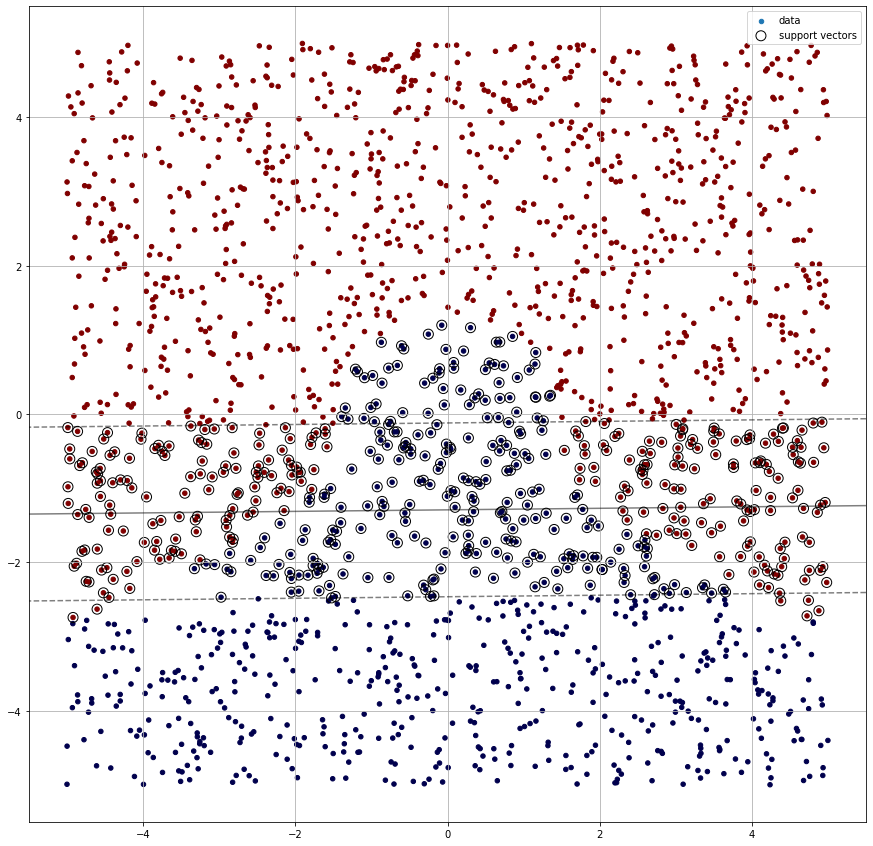

In [ ]:
plot_binary(dataset, model)

### **rbf**

In [ ]:
model = SVC(kernel='rbf')
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.9815

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


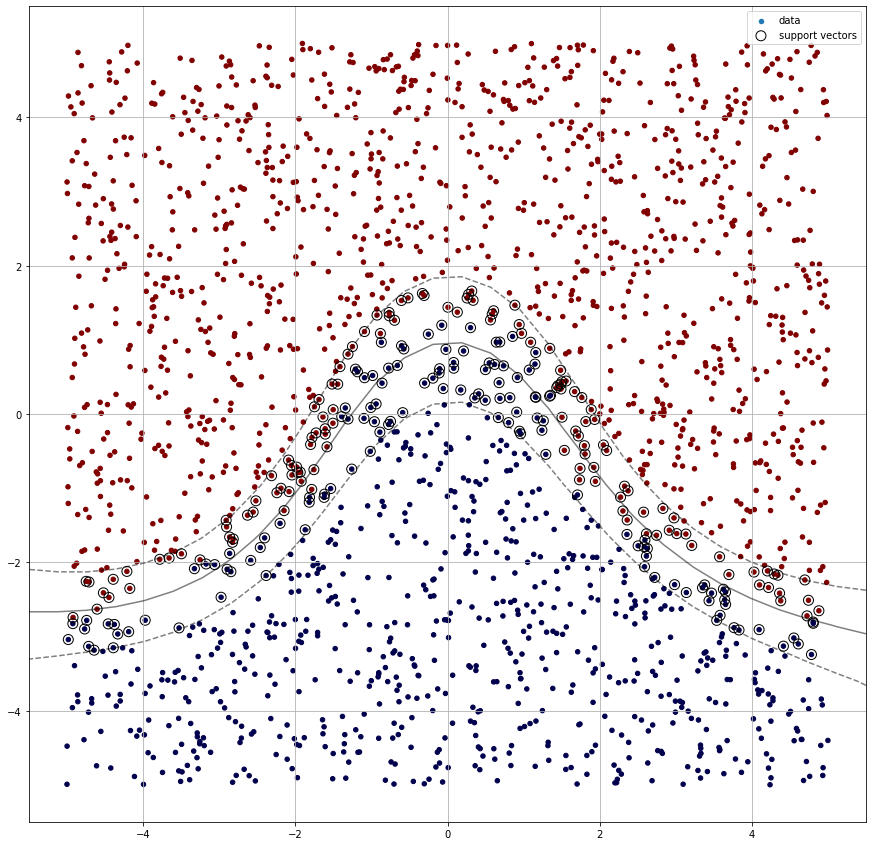

In [ ]:
plot_binary(dataset, model)

### **poly degree = 2**

In [ ]:
model = SVC(kernel='poly', degree=2, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.6155

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


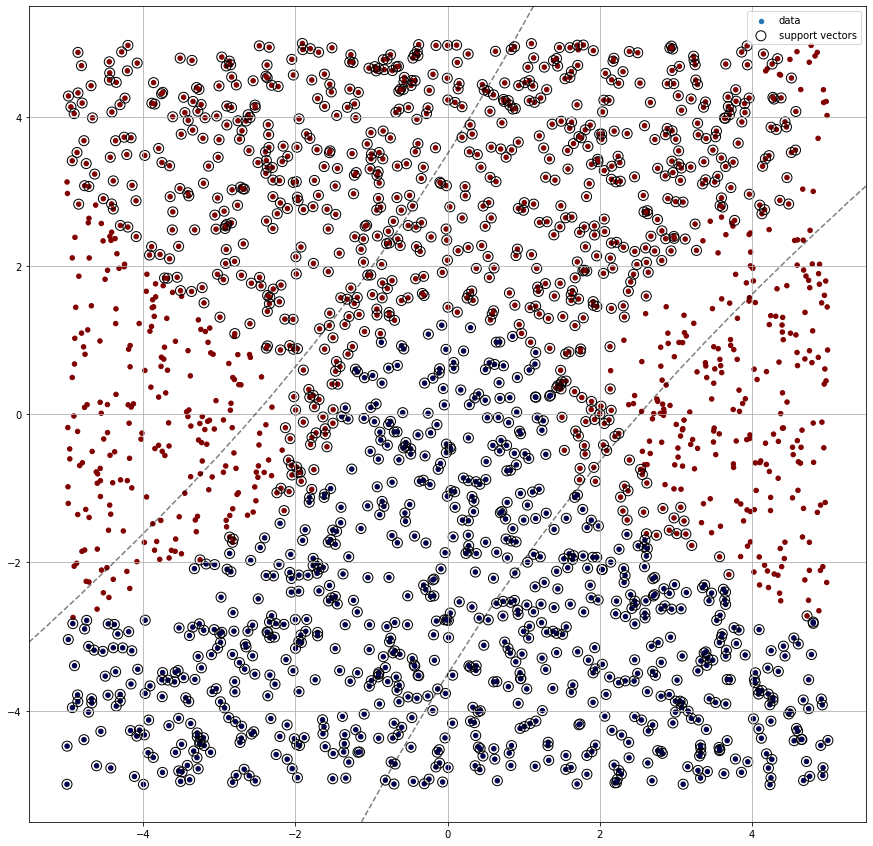

In [ ]:
plot_binary(dataset, model)

### **poly degree = 3**

In [ ]:
model = SVC(kernel='poly', degree=3, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.889

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


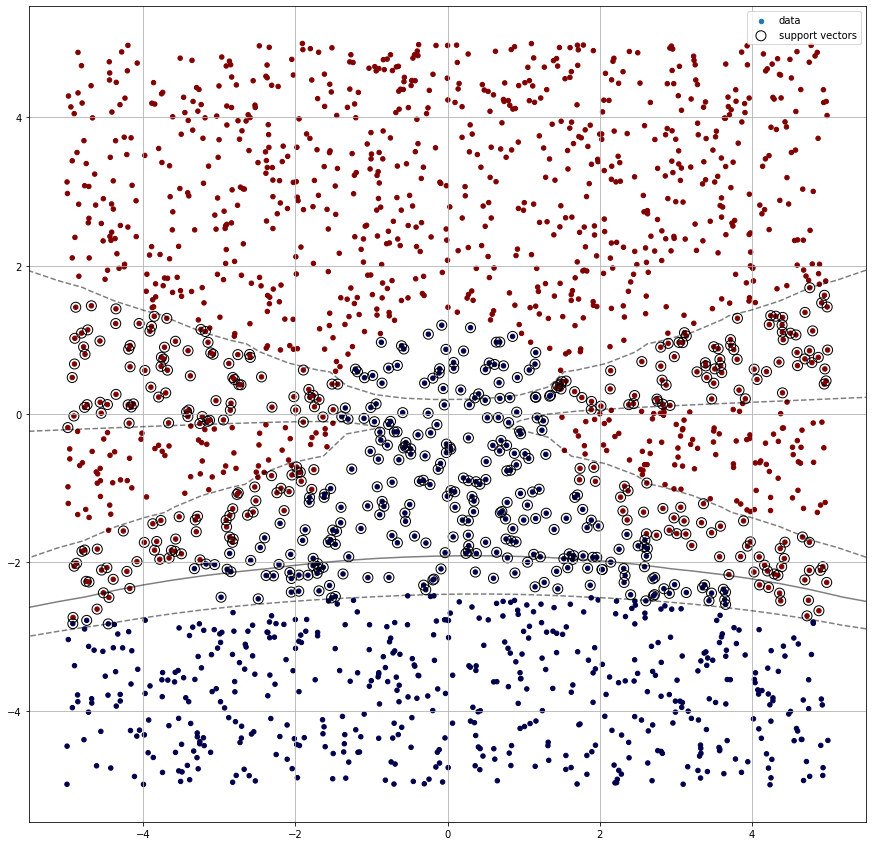

In [ ]:
plot_binary(dataset, model)

### **sigmoid**

In [ ]:
model = SVC(kernel="sigmoid")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.814

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


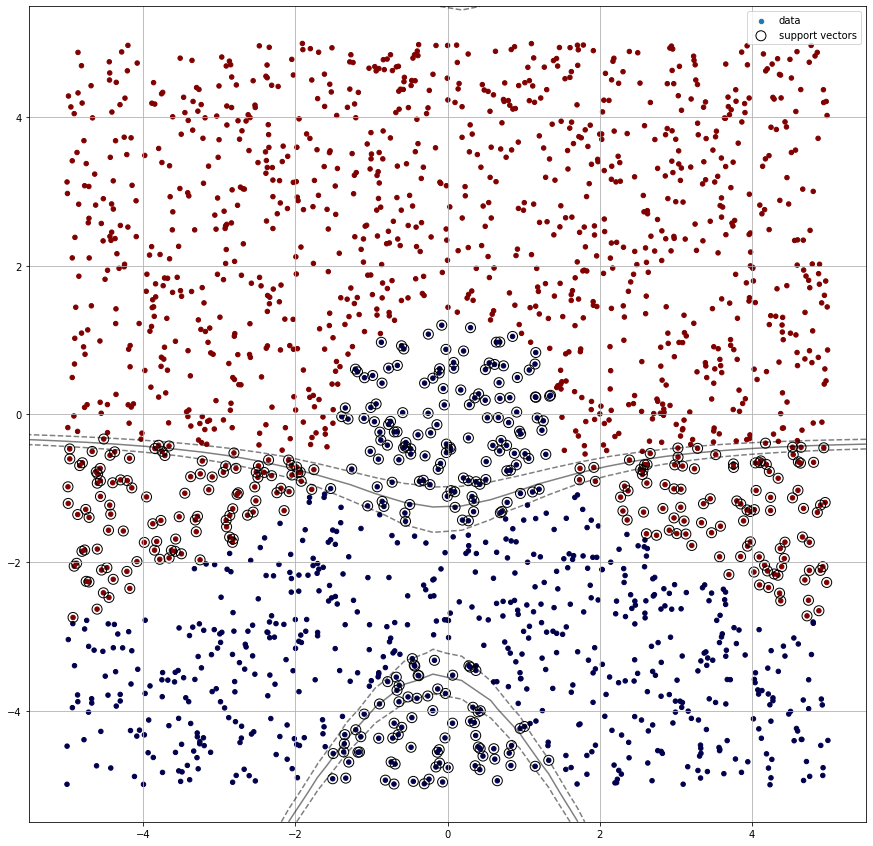

In [ ]:
plot_binary(dataset, model)

## **Example4**

### **data**

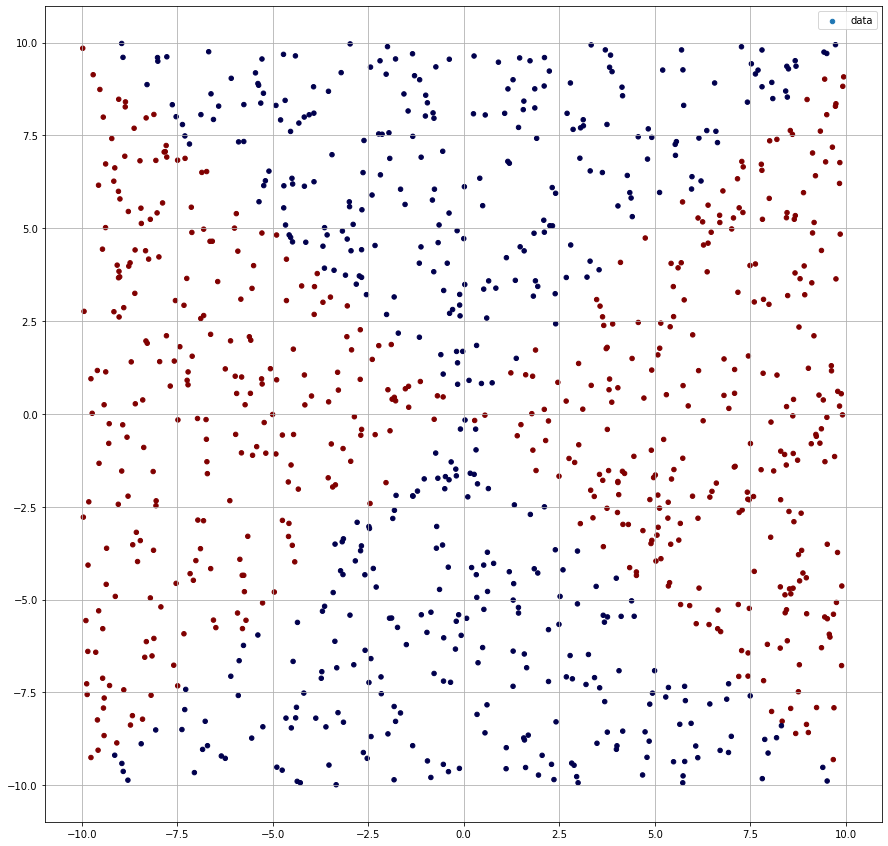

In [ ]:
dataset = generate_binary_dataset(-10, 10, 1000, lambda x, y: x ** 2 - y**2 > 0)
dataset.head()
plot_binary(dataset)

### **linear**

In [ ]:
model = SVC(kernel="linear")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.523

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


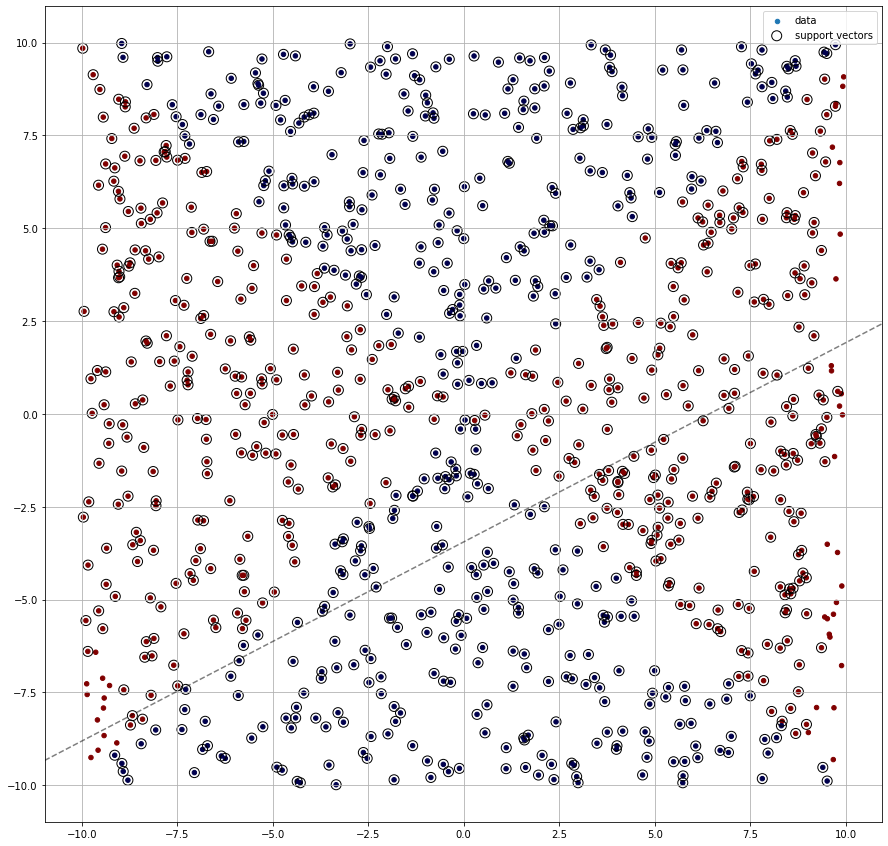

In [ ]:
plot_binary(dataset, model)

### **rbf**

In [ ]:
model = SVC(kernel="rbf")
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)


0.972

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


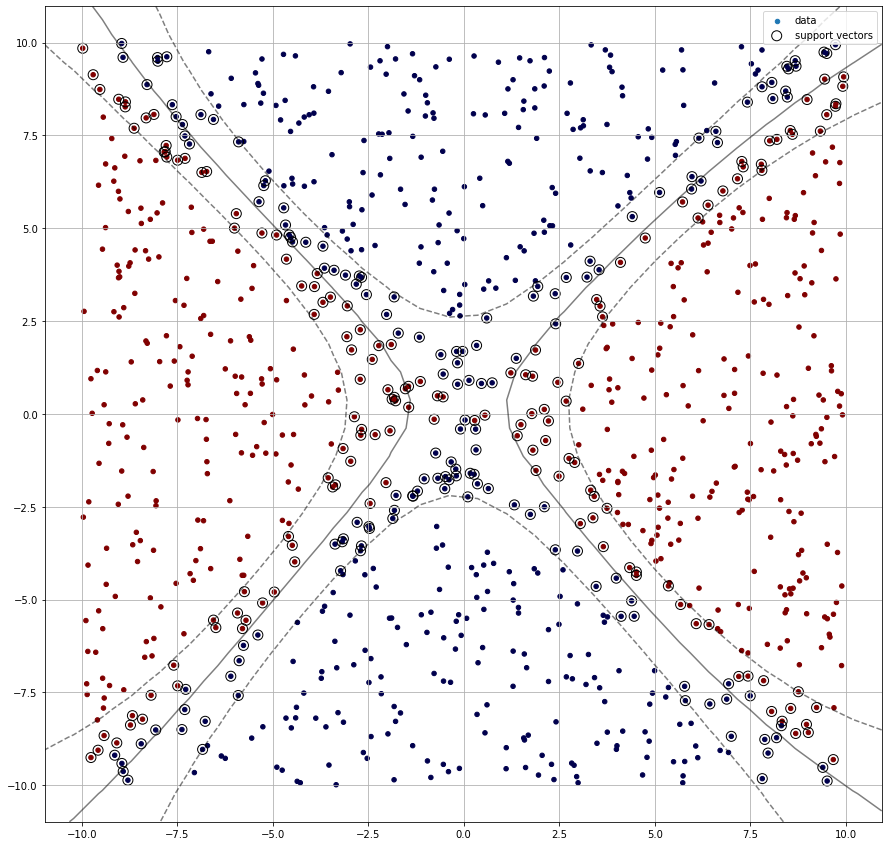

In [ ]:
plot_binary(dataset, model)

### **poly degree = 2**

In [ ]:
model = SVC(kernel='poly', degree=2, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.987

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


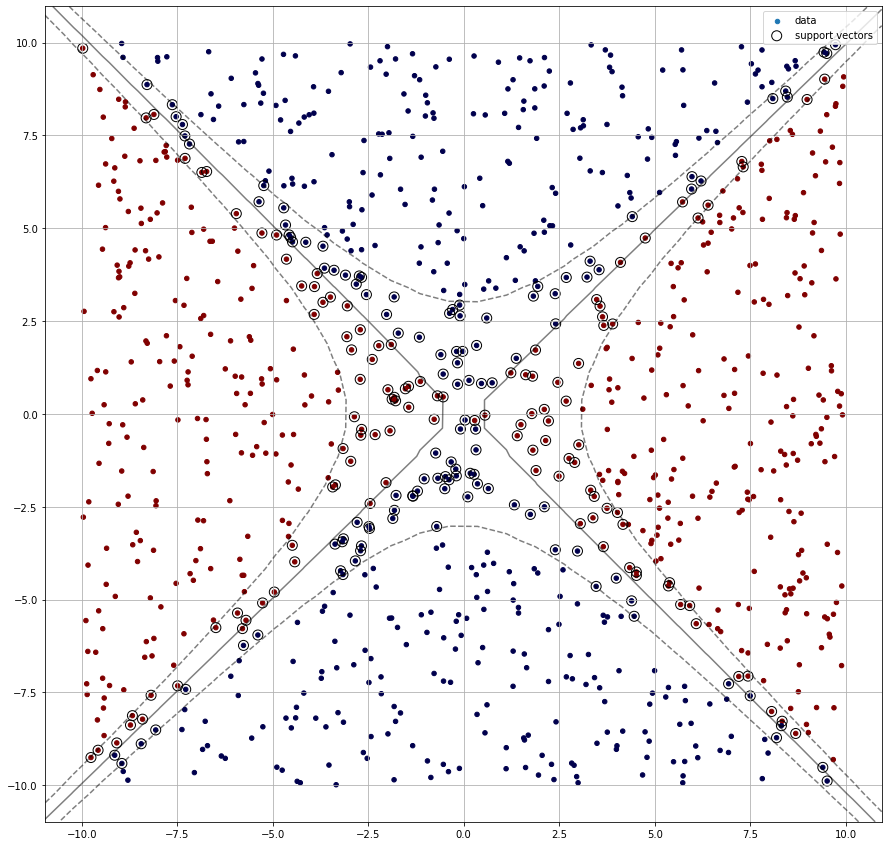

In [ ]:
plot_binary(dataset, model)

### **poly degree = 3**

In [ ]:
model = SVC(kernel='poly', degree=3, tol=1e-3)
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.523

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


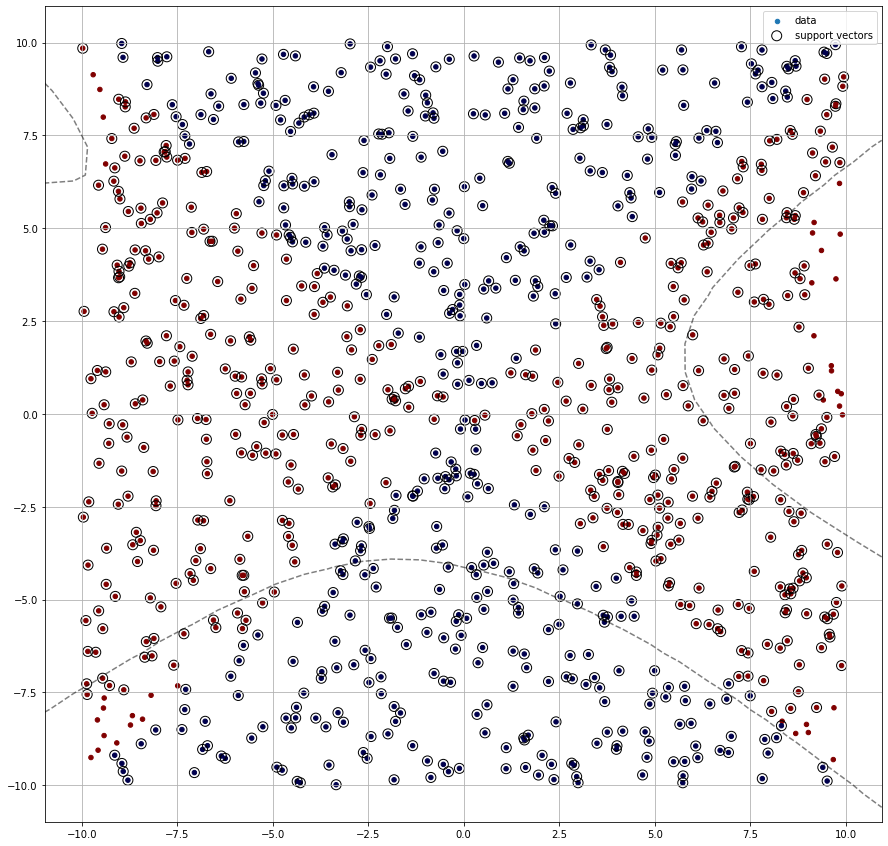

In [ ]:
plot_binary(dataset, model)

### **sigmoid**

In [ ]:
model = SVC(kernel='sigmoid')
model.fit(dataset[['x', 'y']], dataset.target)
model.score(dataset[['x', 'y']], dataset.target)

0.518

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  "X does not have valid feature names, but"


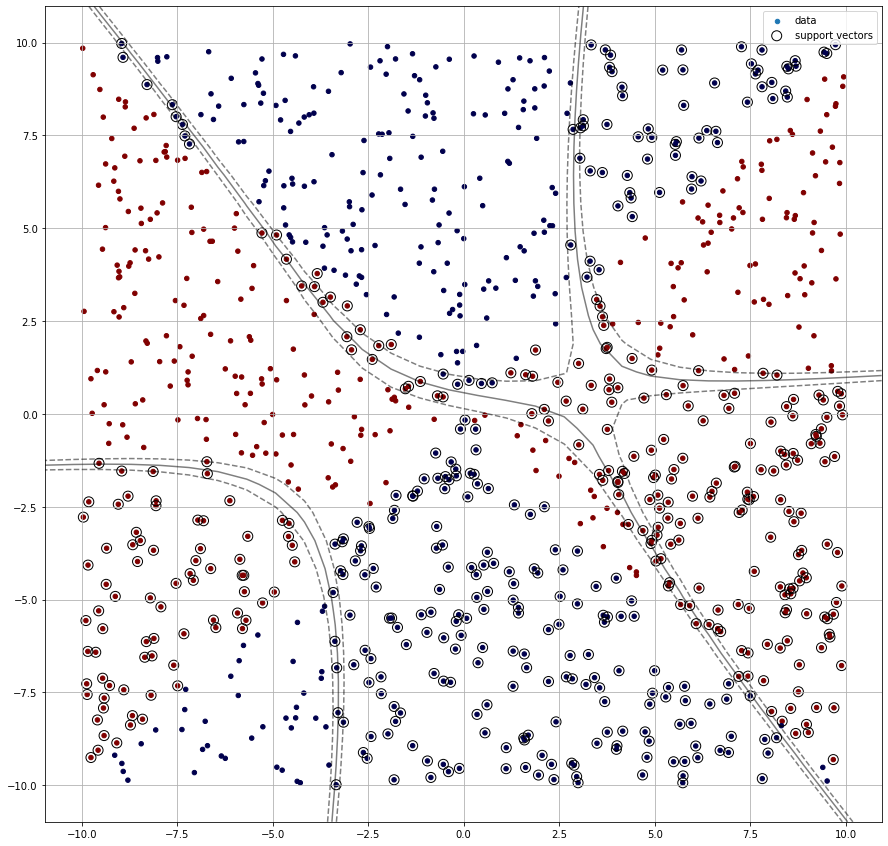

In [ ]:
plot_binary(dataset, model)

# **Section 2**

### **data**

In [9]:
def load_mnist(train_data=True, test_data=False):
    RESOURCES = [
        'train-images-idx3-ubyte.gz',
        'train-labels-idx1-ubyte.gz',
        't10k-images-idx3-ubyte.gz',
        't10k-labels-idx1-ubyte.gz']
    if (os.path.isdir('data') == 0):
        os.mkdir('data')
    if (os.path.isdir('data/mnist') == 0):
        os.mkdir('data/mnist')
    for name in RESOURCES:
        if (os.path.isfile('data/mnist/'+name) == 0):
            url = 'http://yann.lecun.com/exdb/mnist/'+name
            r = requests.get(url, allow_redirects=True)
            open('data/mnist/'+name, 'wb').write(r.content)
    return get_images(train_data, test_data), get_labels(train_data, test_data)
    #train_data = get_images(train_data)
    #test_data = get_images(test_data)
    #train_lable = get_labels(train_data)
    #test_lable = get_labels(test_data)
    #return train_data, test_data, train_lable, test_lable

In [10]:
def get_images(train_data=True, test_data=False):
    to_return = []
    if train_data:
        with gzip.open('data/mnist/train-images-idx3-ubyte.gz', 'r') as f:
            # first 4 bytes is a magic number
            magic_number = int.from_bytes(f.read(4), 'big')
            # second 4 bytes is the number of images
            image_count = int.from_bytes(f.read(4), 'big')
            # third 4 bytes is the row count
            row_count = int.from_bytes(f.read(4), 'big')
            # fourth 4 bytes is the column count
            column_count = int.from_bytes(f.read(4), 'big')
            # rest is the image pixel data, each pixel is stored as an unsigned byte
            # pixel values are 0 to 255
            image_data = f.read()
            train_images = np.frombuffer(image_data, dtype=np.uint8)\
                .reshape((image_count, row_count, column_count))
            to_return.append(np.where(train_images > 127, 1, 0))

    if test_data:
        with gzip.open('data/mnist/t10k-images-idx3-ubyte.gz', 'r') as f:
            # first 4 bytes is a magic number
            magic_number = int.from_bytes(f.read(4), 'big')
            # second 4 bytes is the number of images
            image_count = int.from_bytes(f.read(4), 'big')
            # third 4 bytes is the row count
            row_count = int.from_bytes(f.read(4), 'big')
            # fourth 4 bytes is the column count
            column_count = int.from_bytes(f.read(4), 'big')
            # rest is the image pixel data, each pixel is stored as an unsigned byte
            # pixel values are 0 to 255
            image_data = f.read()
            test_images = np.frombuffer(image_data, dtype=np.uint8)\
                .reshape((image_count, row_count, column_count))
            to_return.append(np.where(test_images > 127, 1, 0))
    arr_return = np.array(to_return[0])
    return arr_return


def get_labels(train_data=True, test_data=False):
    to_return = []
    if train_data:
        with gzip.open('data/mnist/train-labels-idx1-ubyte.gz', 'r') as f:
            # first 4 bytes is a magic number
            magic_number = int.from_bytes(f.read(4), 'big')
            # second 4 bytes is the number of labels
            label_count = int.from_bytes(f.read(4), 'big')
            # rest is the label data, each label is stored as unsigned byte
            # label values are 0 to 9
            label_data = f.read()
            train_labels = np.frombuffer(label_data, dtype=np.uint8)
            to_return.append(train_labels)
    if test_data:
        with gzip.open('data/mnist/t10k-labels-idx1-ubyte.gz', 'r') as f:
            # first 4 bytes is a magic number
            magic_number = int.from_bytes(f.read(4), 'big')
            # second 4 bytes is the number of labels
            label_count = int.from_bytes(f.read(4), 'big')
            # rest is the label data, each label is stored as unsigned byte
            # label values are 0 to 9
            label_data = f.read()
            test_labels = np.frombuffer(label_data, dtype=np.uint8)
            to_return.append(test_labels)
    arr_return = np.array(to_return[0])
    return arr_return

In [11]:
load_mnist(train_data=True, test_data=True)

(array([[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        ...,
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],

In [12]:
train_images = get_images(train_data=True, test_data=False)
test_images = get_images(train_data=False, test_data=True)
train_lables = get_labels(train_data=True, test_data=False)
test_lables = get_labels(train_data=False, test_data=True)

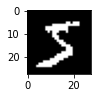

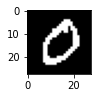

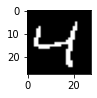

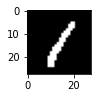

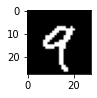

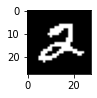

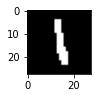

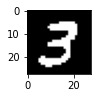

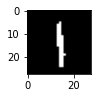

In [13]:
from matplotlib import pyplot
for i in range(9):  
  pyplot.subplot(330 + 1 + i)
  pyplot.imshow(train_images[i], cmap=pyplot.get_cmap('gray'))
  pyplot.show()

In [14]:
def imgtodf(img):
  arr = np.empty((0 ,784), int)
  for i in img:
    array_1d = np.array(i).flatten()
    array_1d = array_1d.reshape(1,784)
    arr = np.append(arr, np.array(array_1d), axis=0)
    df = pd.DataFrame(arr)
    print
  return df

In [15]:
xtrain = pd.read_csv('/content/drive/MyDrive/pattern//Train.csv')
xtest = pd.read_csv('/content/drive/MyDrive/pattern//Test.csv')

In [16]:
ytrain = pd.DataFrame(train_lables)
ytest =  pd.DataFrame(test_lables)

In [17]:
print(xtrain.shape)
print(xtest.shape)
print(ytrain.shape)
print(ytest.shape)

(60000, 784)
(10000, 784)
(60000, 1)
(10000, 1)


### **rbf  , C=10 , gamma = 0.1**

In [ ]:
%%time
classifier = SVC(kernel='rbf', C = 10, gamma = 0.1   , random_state=1)
classifier.fit(xtrain,ytrain)
ypred_rbf = classifier.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, ypred_rbf))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.8361
CPU times: user 4h 18min 28s, sys: 17.8 s, total: 4h 18min 46s
Wall time: 4h 17min 50s


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, ypred_rbf))

#precision
print('Precision:' ,  precision_score(ytest, ypred_rbf, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, ypred_rbf, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,ypred_rbf, average= 'weighted'))

confusion  [[ 818    0  156    2    0    2    1    0    1    0]
 [   0 1107   16    2    1    0    2    0    6    1]
 [   0    0 1022    0    0    0    0    1    9    0]
 [   0    0  173  827    0    1    0    2    6    1]
 [   0    0  176    0  795    0    1    0    2    8]
 [   0    0  192   19    0  677    0    0    4    0]
 [   3    1  237    0    0    6  709    0    2    0]
 [   0    2  165    0    1    2    0  838    3   17]
 [   0    0  223    5    1    1    0    0  744    0]
 [   0    2  145   12   15    2    0    5    4  824]]
Precision: 0.9200691739976633
Recal : 0.8361
f1 score   0.8579899903053473


### **rbf , C = 10**

In [ ]:
%%time
classifier = SVC(kernel='rbf', C = 10 , random_state=1)
classifier.fit(xtrain,ytrain)
ypred_rbf = classifier.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, ypred_rbf))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.9815
CPU times: user 8min 37s, sys: 2.46 s, total: 8min 39s
Wall time: 8min 38s


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, ypred_rbf))

#precision
print('Precision:' ,  precision_score(ytest, ypred_rbf, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, ypred_rbf, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,ypred_rbf, average= 'weighted'))

confusion  [[ 972    0    1    0    0    4    0    1    2    0]
 [   0 1130    3    0    0    1    1    0    0    0]
 [   4    1 1013    2    1    0    2    6    3    0]
 [   0    0    3  992    0    4    0    5    4    2]
 [   0    0    5    0  959    0    3    1    0   14]
 [   2    0    0    8    1  875    3    0    2    1]
 [   4    2    0    0    2    4  945    0    1    0]
 [   0    6    7    2    2    1    0 1001    1    8]
 [   3    0    1    4    3    3    1    4  953    2]
 [   2    4    0    5    7    2    1   10    3  975]]
Precision: 0.9814912363351382
Recal : 0.9815
f1 score   0.9814894987581091


### **rbf , C = 0.1**

In [ ]:
%%time
classifier = SVC(kernel='rbf', C = 0.1  , random_state=1)
classifier.fit(xtrain,ytrain)
ypred_rbf = classifier.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, ypred_rbf))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.9534
CPU times: user 14min 47s, sys: 1.25 s, total: 14min 48s
Wall time: 14min 51s


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, ypred_rbf))

#precision
print('Precision:' ,  precision_score(ytest, ypred_rbf, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, ypred_rbf, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,ypred_rbf, average= 'weighted'))

confusion  [[ 968    0    3    1    0    4    2    1    1    0]
 [   0 1124    3    2    0    1    4    0    1    0]
 [   7    1  970    7   12    0    7   11   17    0]
 [   0    1   11  959    0   13    1   10   12    3]
 [   1    0    3    0  940    0   10    1    2   25]
 [   6    2    2   18    6  836   11    2    8    1]
 [   9    3    2    0    5    7  930    0    2    0]
 [   1   15   18    1    6    0    0  963    4   20]
 [   4    1    5   14    8   14    8    5  910    5]
 [   7    6    1   12   24    8    1    9    7  934]]
Precision: 0.9533493839638925
Recal : 0.9534
f1 score   0.9533040782146134


### **rbf , C = 1**

In [ ]:
%%time
classifier = SVC(kernel='rbf', C = 1   , random_state=1)
classifier.fit(xtrain,ytrain)
ypred_rbf = classifier.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, ypred_rbf))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Accuracy: 0.9769
CPU times: user 7min 47s, sys: 658 ms, total: 7min 48s
Wall time: 7min 46s


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, ypred_rbf))

#precision
print('Precision:' ,  precision_score(ytest, ypred_rbf, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, ypred_rbf, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,ypred_rbf, average= 'weighted'))

confusion  [[ 971    0    1    0    0    4    1    1    2    0]
 [   0 1129    3    0    0    1    1    0    1    0]
 [   4    1 1008    2    1    0    2    7    7    0]
 [   0    0    4  989    0    2    0    8    6    1]
 [   1    0    4    0  958    0    4    0    2   13]
 [   2    1    0    9    0  870    3    1    5    1]
 [   6    2    0    0    3    5  941    0    1    0]
 [   0   10   13    2    1    0    0  992    0   10]
 [   3    0    3    6    4    4    1    5  947    1]
 [   4    5    1    7   14    2    1    8    3  964]]
Precision: 0.9768870910990339
Recal : 0.9769
f1 score   0.9768751866833217


### **linear , C  = 1**

In [18]:
%%time
clftotal = make_pipeline(StandardScaler(),
                     LinearSVC(random_state=0))
clftotal.fit(xtrain, ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 12min 24s, sys: 899 ms, total: 12min 25s
Wall time: 12min 26s


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [19]:
%%time
ypred_linear = clftotal.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, ypred_linear))

Accuracy: 0.9033
CPU times: user 161 ms, sys: 0 ns, total: 161 ms
Wall time: 113 ms


In [20]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, ypred_linear))

#precision
print('Precision:' ,  precision_score(ytest, ypred_linear, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, ypred_linear, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,ypred_linear, average= 'weighted'))

confusion  [[ 955    0    1    1    1    7    6    8    1    0]
 [   0 1110    4    2    0    2    4    0   12    1]
 [  11   13  883   27   10    5   19   14   46    4]
 [   5    2   23  904    5   28    2   16   19    6]
 [   2    4    6    2  891    2   12   11    6   46]
 [  15    5    4   34   12  758   16   14   24   10]
 [  10    4    6    5    5   20  903    2    3    0]
 [   3   13   22    7    4    1    4  945    2   27]
 [  10   16   11   24   14   44   13   15  818    9]
 [  13    7    1   10   39   11    0   46   16  866]]
Precision: 0.9029743718086817
Recal : 0.9033
f1 score   0.9028373015178773


### **linear , C = 10**

In [21]:
%%time
clftotal = make_pipeline(StandardScaler(),
                     LinearSVC(random_state=0,C=10))
clftotal.fit(xtrain, ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 13min 57s, sys: 719 ms, total: 13min 58s
Wall time: 13min 59s


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [22]:
%%time
ypred_linear = clftotal.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, ypred_linear))

Accuracy: 0.8701
CPU times: user 128 ms, sys: 22 ms, total: 150 ms
Wall time: 104 ms


In [23]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, ypred_linear))

#precision
print('Precision:' ,  precision_score(ytest, ypred_linear, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, ypred_linear, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,ypred_linear, average= 'weighted'))

confusion  [[ 914    0    3    8    1   25   13    4   11    1]
 [   0 1094    9    5    0   11    4    0   12    0]
 [   9   18  877   22    6    5   21   18   50    6]
 [   2    3   28  856    6   64    3   11   25   12]
 [   2    1   12    4  827    7    9    6   16   98]
 [   9    4    7   41   13  730   21   12   38   17]
 [   9    4   10    7    8   17  893    2    7    1]
 [   1    8   24   13    5    8    4  852    4  109]
 [  11   11   14   22   12   62   16   11  761   54]
 [   6    4    1   15   33   13    1   25   14  897]]
Precision: 0.8731780202958099
Recal : 0.8701
f1 score   0.8705926227833973


### **linear , C = 0.1**

In [ ]:
%%time
clftotal = make_pipeline(StandardScaler(),
                     LinearSVC(random_state=0,C=0.1, tol=1e-5))
clftotal.fit(xtrain, ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 9min 24s, sys: 783 ms, total: 9min 25s
Wall time: 10min 26s


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:1208: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  ConvergenceWarning,


In [ ]:
%%time
ypred_linear = clftotal.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, ypred_linear))

Accuracy: 0.9102
CPU times: user 142 ms, sys: 39.9 ms, total: 182 ms
Wall time: 223 ms


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, ypred_linear))

#precision
print('Precision:' ,  precision_score(ytest, ypred_linear, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, ypred_linear, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,ypred_linear, average= 'weighted'))

confusion  [[ 956    0    1    1    1    8    6    4    3    0]
 [   0 1109    5    1    0    3    4    0   13    0]
 [  13    9  898   21   12    5   18   11   40    5]
 [   5    3   21  911    4   25    4   13   18    6]
 [   2    3    4    2  909    1    9    4    7   41]
 [  11    4    3   38   13  762   14   10   29    8]
 [  11    4    5    2    6   20  906    0    4    0]
 [   2   11   23    8    6    4    1  938    2   33]
 [   9   14    9   21   14   32   13   14  834   14]
 [   8    8    0   12   44   10    0   32   16  879]]
Precision: 0.9099162138559664
Recal : 0.9102
f1 score   0.9098654689925526


### **poly , C = 1 , degree = 2**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=1, degree=2)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 5min 27s, sys: 530 ms, total: 5min 27s
Wall time: 5min 32s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9748


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 969    0    1    0    0    4    3    1    2    0]
 [   0 1128    3    0    0    1    3    0    0    0]
 [   6    2 1002    1    2    0    4    9    6    0]
 [   0    0    5  984    0    6    0    8    5    2]
 [   1    0    4    0  961    0    4    0    0   12]
 [   2    2    0    9    2  867    4    0    5    1]
 [   7    2    2    0    4    5  937    0    1    0]
 [   0   13   10    1    0    0    0  995    0    9]
 [   3    0    3    5    6    6    0    5  944    2]
 [   4    5    1    6   16    3    1    7    5  961]]
Precision: 0.9747933393257754
Recal : 0.9748
f1 score   0.9747714902801563


### **poly , C = 0.1 , degree = 2**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=0.1, degree=2)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 11min 44s, sys: 1.27 s, total: 11min 46s
Wall time: 11min 42s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9546


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 967    0    2    0    0    7    2    1    1    0]
 [   0 1122    2    2    0    1    4    0    4    0]
 [   6    3  980    4   12    1    6   12    8    0]
 [   0    2   13  956    0   16    0   10    9    4]
 [   1    3    3    0  942    0    9    2    1   21]
 [   5    3    4   20    4  837    9    2    7    1]
 [   5    3    1    0    7    8  933    0    1    0]
 [   0   22   17    2    4    0    0  964    2   17]
 [   5    2    6   12   10   14    8    6  905    6]
 [   6    7    0    9   22    7    1    8    9  940]]
Precision: 0.9545719820608812
Recal : 0.9546
f1 score   0.9545045181372891


### **poly , C = 10 , degree = 2**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=10, degree=2)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 5min 12s, sys: 791 ms, total: 5min 13s
Wall time: 5min 11s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.978


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 974    0    1    0    0    1    1    1    2    0]
 [   0 1129    3    0    0    1    2    0    0    0]
 [   6    2 1009    2    1    0    3    4    5    0]
 [   0    0    3  988    0    6    0    7    4    2]
 [   0    0    5    0  958    0    2    3    0   14]
 [   2    1    0    7    2  872    3    0    4    1]
 [   6    2    2    0    3    8  935    0    2    0]
 [   0    8   10    2    2    0    0 1001    0    5]
 [   3    0    1    6    4    5    2    5  946    2]
 [   4    5    0    5   10    4    1   10    2  968]]
Precision: 0.9780013741760697
Recal : 0.978
f1 score   0.9779797332630878


### **poly , C = 10 , degree = 3**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=10, degree=3)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 5min 58s, sys: 451 ms, total: 5min 58s
Wall time: 5min 56s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9754


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 971    0    1    0    0    5    0    1    2    0]
 [   0 1128    3    0    0    0    4    0    0    0]
 [   6    3 1001    1    1    2    4    8    6    0]
 [   0    2    1  989    0    4    0    7    4    3]
 [   1    0    4    0  960    0    3    2    0   12]
 [   3    2    0   12    1  863    4    1    5    1]
 [   4    5    2    0    5    8  932    0    2    0]
 [   0   13    8    1    1    0    0  997    0    8]
 [   2    1    2    3    5    6    0    6  946    3]
 [   3    6    1    5   12    4    1    9    1  967]]
Precision: 0.9754143009307642
Recal : 0.9754
f1 score   0.9753793748748519


### **poly , C = 1 , degree = 3**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=1, degree=3)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 7min 8s, sys: 599 ms, total: 7min 8s
Wall time: 7min 6s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9729


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 969    0    1    0    0    5    2    1    2    0]
 [   0 1128    3    0    0    0    3    0    1    0]
 [   6    3  997    2    3    1    5   10    5    0]
 [   0    1    1  986    0    7    0    8    4    3]
 [   1    2    3    0  958    1    4    1    0   12]
 [   3    2    0   10    1  865    5    0    5    1]
 [   5    6    2    0    4    6  933    0    2    0]
 [   1   17    8    1    1    0    0  990    0   10]
 [   2    1    2    5    7    9    0    3  941    4]
 [   3    6    1    4   16    5    1    7    4  962]]
Precision: 0.9729320356872162
Recal : 0.9729
f1 score   0.9728739882897719


### **poly , C = 0.1 , degree = 3**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=0.1, degree=3)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 13min 44s, sys: 1.22 s, total: 13min 45s
Wall time: 13min 41s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9491


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 952    0    2    0    0   19    5    1    1    0]
 [   0 1121    2    2    0    1    4    0    5    0]
 [   5   22  956    5   10    4    4   16   10    0]
 [   0   11    9  953    0   17    0   11    6    3]
 [   1   12    3    0  939    0    8    3    1   15]
 [   3    6    3   13    2  848    7    2    7    1]
 [   5   12    1    0    4    8  927    0    1    0]
 [   0   32   16    2    3    0    0  958    2   15]
 [   4    8    4   13   11   17    5    5  901    6]
 [   6   13    1    9   23    5    1    8    7  936]]
Precision: 0.949732523003243
Recal : 0.9491
f1 score   0.9490958983618951


### **poly , C = 10 , degree = 4**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=10, degree=4)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 6min 30s, sys: 496 ms, total: 6min 31s
Wall time: 6min 28s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9671


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 965    1    1    0    0    8    3    1    1    0]
 [   0 1124    3    1    0    0    5    1    1    0]
 [   8   10  987    2    2    1    5   10    7    0]
 [   0    8    2  978    0    7    0    8    4    3]
 [   1    3    3    0  958    0    5    1    0   11]
 [   3    4    3   11    1  854    5    1    8    2]
 [   5   11    1    0    4    7  927    0    3    0]
 [   0   18    9    2    2    0    0  987    0   10]
 [   5    2    1    7    5   12    0    4  934    4]
 [   4   11    1    5   14    3    1    7    6  957]]
Precision: 0.9672628641154549
Recal : 0.9671
f1 score   0.9670842788141348


### **poly , C = 1 , degree = 4**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=1, degree=4)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 8min 53s, sys: 779 ms, total: 8min 54s
Wall time: 8min 51s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9617


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 960    0    1    0    0   11    6    1    1    0]
 [   0 1123    2    2    0    1    4    0    3    0]
 [   6   19  978    2    1    1    5   12    8    0]
 [   0   10    1  974    0    9    0    9    4    3]
 [   1   11    3    0  949    0    5    1    1   11]
 [   4    5    3   10    1  857    5    0    6    1]
 [   5   16    1    0    5    6  923    0    2    0]
 [   0   32    9    2    2    0    0  973    0   10]
 [   3    6    1   10    7   13    0    2  928    4]
 [   5   12    1    4   18    4    1    7    5  952]]
Precision: 0.9623345259539665
Recal : 0.9617
f1 score   0.9617602356907344


### **poly , C = 0.1 , degree = 4**

In [ ]:
%%time
polycl = SVC(kernel='poly', C=0.1, degree=4)
polycl.fit(xtrain,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 17min 52s, sys: 1.65 s, total: 17min 54s
Wall time: 18min 2s


In [ ]:
poly_ypred = polycl.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, poly_ypred))

Accuracy: 0.9302


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, poly_ypred))

#precision
print('Precision:' ,  precision_score(ytest, poly_ypred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, poly_ypred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,poly_ypred, average= 'weighted'))

confusion  [[ 925   19    1    0    0   28    5    2    0    0]
 [   0 1123    2    2    0    0    2    0    6    0]
 [   6   60  926    2    8    2    4   16    8    0]
 [   0   38    5  931    0   17    0   10    5    4]
 [   1   39    2    0  920    0    7    1    0   12]
 [   4   32    3   10    1  828    6    2    5    1]
 [   5   38    0    0    6    7  901    0    1    0]
 [   1   54   16    2    4    0    0  936    1   14]
 [   5   30    4   11    9   12    2    6  887    8]
 [   7   24    1    7   22    7    1   10    5  925]]
Precision: 0.9364263443589969
Recal : 0.9302
f1 score   0.9313736728566228


### **sigmoid , C = 1**

In [ ]:
%%time
sig_class = SVC(kernel='sigmoid', C=1 , random_state=1)
sig_class.fit(xtrain ,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 7min 21s, sys: 526 ms, total: 7min 22s
Wall time: 7min 21s


In [ ]:
sig_pred = sig_class.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, sig_pred))

Accuracy: 0.7978


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, sig_pred))

#precision
print('Precision:' ,  precision_score(ytest, sig_pred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, sig_pred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,sig_pred, average= 'weighted'))

confusion  [[ 851    0   27    6    0   83    7    3    3    0]
 [   0 1077   11   12    0    3    3    1   28    0]
 [  28   35  805   23   18   18   40    6   55    4]
 [  22    6   43  762    3  111    2   12   38   11]
 [   9    6   11    1  829    9   10    7   15   85]
 [  46   19    7   98   22  613   13    6   57   11]
 [  41    4   67    1   28   44  767    0    6    0]
 [  14   17   36    9   14    0    0  866    8   64]
 [  24   41   31   34   25  115   15    9  649   31]
 [  14    7   13    9   82   26    0   66   33  759]]
Precision: 0.8004093266730055
Recal : 0.7978
f1 score   0.7980525309565696


### **sigmoid , C = 10**

In [ ]:
%%time
sig_class = SVC(kernel='sigmoid', C=10 , random_state=1)
sig_class.fit(xtrain ,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 6min 16s, sys: 457 ms, total: 6min 16s
Wall time: 6min 14s


In [ ]:
sig_pred = sig_class.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, sig_pred))

Accuracy: 0.7777


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, sig_pred))

#precision
print('Precision:' ,  precision_score(ytest, sig_pred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, sig_pred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,sig_pred, average= 'weighted'))

confusion  [[ 849    0   30    7    0   82    4    2    6    0]
 [   0 1063   22   15    0    3    4    2   26    0]
 [  33   51  771   29   17   19   41    6   59    6]
 [  27   13   30  753    1  120    2   18   37    9]
 [  12    8   15    0  811    9   13    7   15   92]
 [  51   15    8  101   24  602   11    7   66    7]
 [  46    4   69    1   26   38  765    0    9    0]
 [  22   22   44    9   12    2    0  847    7   63]
 [  32   53   30   42   18  128   10   12  632   17]
 [  18    7   14    9  108   35    0   76   58  684]]
Precision: 0.7809645206657846
Recal : 0.7777
f1 score   0.777772264744781


### **sigmoid , C = 0.1**

In [ ]:
%%time
sig_class = SVC(kernel='sigmoid', C=0.1 , random_state=1)
sig_class.fit(xtrain ,ytrain)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


CPU times: user 13min 14s, sys: 950 ms, total: 13min 15s
Wall time: 13min 10s


In [ ]:
sig_pred = sig_class.predict(xtest)
print("Accuracy:", metrics.accuracy_score(ytest, sig_pred))

Accuracy: 0.8732


In [ ]:
#confusion matrix
print('confusion ' , confusion_matrix(ytest, sig_pred))

#precision
print('Precision:' ,  precision_score(ytest, sig_pred, average='weighted'))


#recall

print('Recal :' , recall_score(ytest, sig_pred, average='weighted'))


#f1 score
print('f1 score  ' , f1_score(ytest,sig_pred, average= 'weighted'))

confusion  [[ 934    0    3    1    1   27   11    2    1    0]
 [   0 1108    3    4    0    3    4    0   13    0]
 [  19    8  861   21   22    5   30   14   47    5]
 [  10    2   25  859    1   66    2   13   24    8]
 [   1    3    4    1  888    0   14    3    3   65]
 [  18   19    5   96   16  684   21    3   24    6]
 [  22    3   22    1   10   26  873    0    1    0]
 [   4   21   27    4   14    0    0  911    5   42]
 [  16   22   16   27   13   58   17   15  770   20]
 [  10    7    7   12   69   12    0   35   13  844]]
Precision: 0.872732967238879
Recal : 0.8732
f1 score   0.8725348246510978


# **Section 3**

In [ ]:
!gdown --id 1mQhnAAP5djmRjmN5rC7KI_-L537Z5Iva

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1mQhnAAP5djmRjmN5rC7KI_-L537Z5Iva
To: /content/persian_LPR.rar
100% 1.21M/1.21M [00:00<00:00, 27.9MB/s]


In [ ]:
!unrar x './persian_LPR.rar'


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from ./persian_LPR.rar


Would you like to replace the existing file 2/100_13,96222_2616_8_0.82_2_18933 - Copy.bmp
  1334 bytes, modified on 2017-12-09 08:29
with a new one
  1334 bytes, modified on 2017-12-09 08:29

[Y]es, [N]o, [A]ll, n[E]ver, [R]ename, [Q]uit A

Extracting  2/100_13,96222_2616_8_0.82_2_18933 - Copy.bmp                  0%  OK 
Extracting  2/101_12G62588_8603_5_0.89_2_15317.bmp                         0%  OK 
Extracting  2/102_52I99268_9035_6_0.79_4_19363.bmp                         0%  OK 
Extracting  2/103_95,91268_3223_6_0.73_2_15889.bmp                         0%  OK 
Extracting  2/104_16F55829_179_7_0.78_2_17492.bmp                          0%  OK 
Extracting  2/105_96I24468_101_4_0.89_2_19676.bmp                          0%  OK 
Extracting  2/106_16,69921_1525_7_0.75_2_17387.bmp                         0%  OK 
Extracting

In [ ]:
def dataframeproducer(path , label):
  list1 = []
  dim = (1 , 256 )
  for i in glob.glob(path) :
    image = cv.imread(i , 0) 
    image = cv.resize(image , dim)
    list1.append(image)
  num = np.asarray(list1)
  result = num[:, :, 0]
  # print(result.shape)
  df = pd.DataFrame(result)
  # # df['target'] = label
  df['target'] = label
  return df



In [ ]:
pic2 = dataframeproducer('./2/*.bmp','2')
pic3 = dataframeproducer('./3/*.bmp','3')
pic7 = dataframeproducer('./7/*.bmp','7')
picS = dataframeproducer('./S/*.bmp','s')
picw = dataframeproducer('./W/*.bmp','w')

columns = [pic2, pic3, pic7, picS, picw]
dataset = pd.concat(columns)
dataset = dataset.sample(frac=1).reset_index(drop=True)
dataset

,0,1,2,3,4,5,6,7,8,9,...,247,248,249,250,251,252,253,254,255,target
0,86,86,86,86,86,86,86,86,87,89,...,96,96,96,96,96,96,96,96,96,3
1,86,86,86,86,86,86,86,86,86,84,...,88,86,86,86,86,86,86,86,86,3
2,83,83,83,83,83,83,83,83,84,87,...,72,72,72,72,72,72,72,72,72,s
3,10,10,10,10,10,10,10,10,10,11,...,12,12,12,12,12,12,12,12,12,w
4,92,92,92,92,92,92,92,92,93,97,...,48,47,47,47,47,47,47,47,47,s
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,31,31,31,31,31,31,31,31,32,33,...,45,44,44,44,44,44,44,44,44,s
1496,58,58,58,58,58,58,58,58,59,60,...,55,55,55,55,55,55,55,55,55,w
1497,15,15,15,15,15,15,15,15,15,16,...,9,8,8,8,8,8,8,8,8,w
1498,66,66,66,66,66,66,66,66,66,66,...,69,66,66,66,66,66,66,66,66,7


In [ ]:
x = dataset.drop('target', axis=1).values.astype('float32') / 255
y = dataset.target.values

In [ ]:
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.3, random_state=1)

In [ ]:
model_sec3 = SVC(kernel='rbf' , C = 10 )
model_sec3.fit(xtrain, ytrain)
ypred = model_sec3.predict(xtest)
print("Accuracy is :", metrics.accuracy_score(ytest, ypred))

Accuracy is : 0.8111111111111111


In [ ]:
scoring = ['accuracy', 'f1_macro', 'precision_macro', 'recall_macro']
cross_val = KFold(n_splits = 5, random_state=1, shuffle=True)
model = SVC(kernel='rbf', C=10)
print(cross_validate(model, xtrain, ytrain, scoring=scoring, cv=cross_val))

{'fit_time': array([0.06829286, 0.05549002, 0.05423284, 0.05917835, 0.0670948 ]), 'score_time': array([0.06510758, 0.04223228, 0.05993485, 0.04144716, 0.0424459 ]), 'test_accuracy': array([0.8       , 0.78571429, 0.76666667, 0.81428571, 0.82380952]), 'test_f1_macro': array([0.79629562, 0.78458956, 0.76071553, 0.81010647, 0.82594405]), 'test_precision_macro': array([0.80014516, 0.79175259, 0.77400141, 0.81037389, 0.83328036]), 'test_recall_macro': array([0.80588526, 0.78698382, 0.78711214, 0.81069946, 0.8225672 ])}
